# **Import Library**

In [3]:
import os
import tensorflow as tf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

In [4]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau
from tensorflow.python.keras.utils.vis_utils import plot_model
from tensorflow.keras.applications import MobileNetV2
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import load_model


# **EDA (Exploratory Data Analysis)**

In [4]:
BASE_DIR="ML_NutriCheck"
train_dir="ML_NutriCheck/train"
test_dir="ML_NutriCheck/test"
validation_dir="ML_NutriCheck/validation"

print(f'Contents of base directory: {os.listdir(BASE_DIR)}')
print(f'Contents of train directory: {os.listdir(train_dir)}')
print(f'Contents of validation directory: {os.listdir(validation_dir)}')

Contents of base directory: ['test', 'train', 'validation']
Contents of train directory: ['cup_cakes', 'ice_cream', 'samosa', 'nasi kuning', 'donuts', 'oxtail soup', 'french_toast', 'steak', 'cheesecake', 'red_velvet_cake', 'waffles', 'churros', 'gyoza', 'spaghetti_bolognese', 'risotto', 'chicken porridge', 'spring_rolls', 'sashimi', 'rendang', 'Tempeh', 'hot_dog', 'green bean porridge', 'ikan bakar', 'fish_and_chips', 'pad_thai', 'tiramisu', 'meatball', 'takoyaki', 'macarons', 'grilled chicken', 'nasi uduk', 'kupat tahu', 'spaghetti_carbonara', 'omelette', 'chicken wings', 'sushi', 'bibimbap', 'fried shrimp', 'chicken noodle', 'chocolate_cake', 'tacos', 'hamburger', 'pancakes', 'pizza', 'gado-gado', 'macaroni_and_cheese', 'satay', 'ramen', 'chicken Soto', 'lasagna', 'french_fries', 'fried_rice', 'oysters']
Contents of validation directory: ['cup_cakes', 'ice_cream', 'samosa', 'nasi kuning', 'donuts', 'oxtail soup', 'french_toast', 'steak', 'cheesecake', 'red_velvet_cake', 'waffles', '

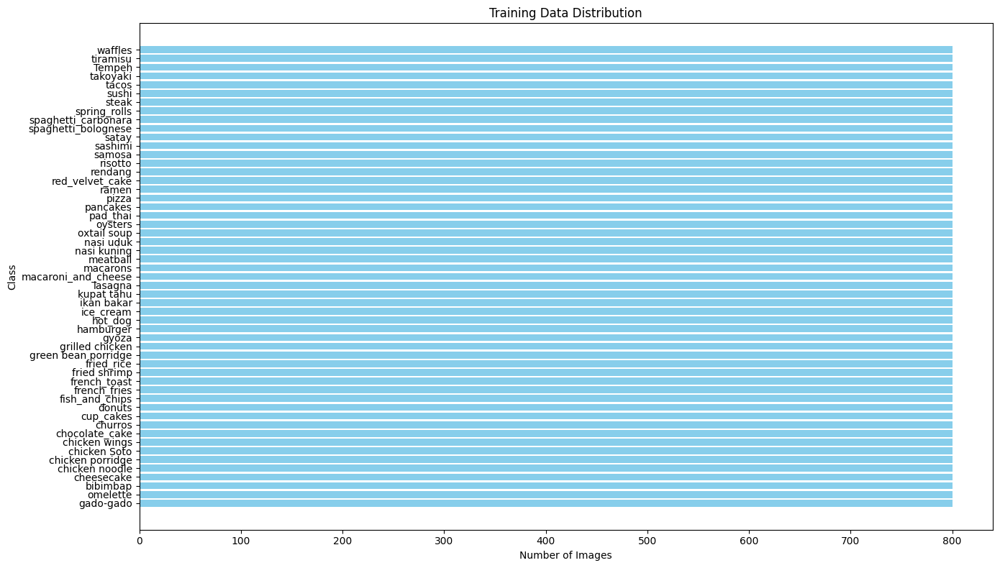

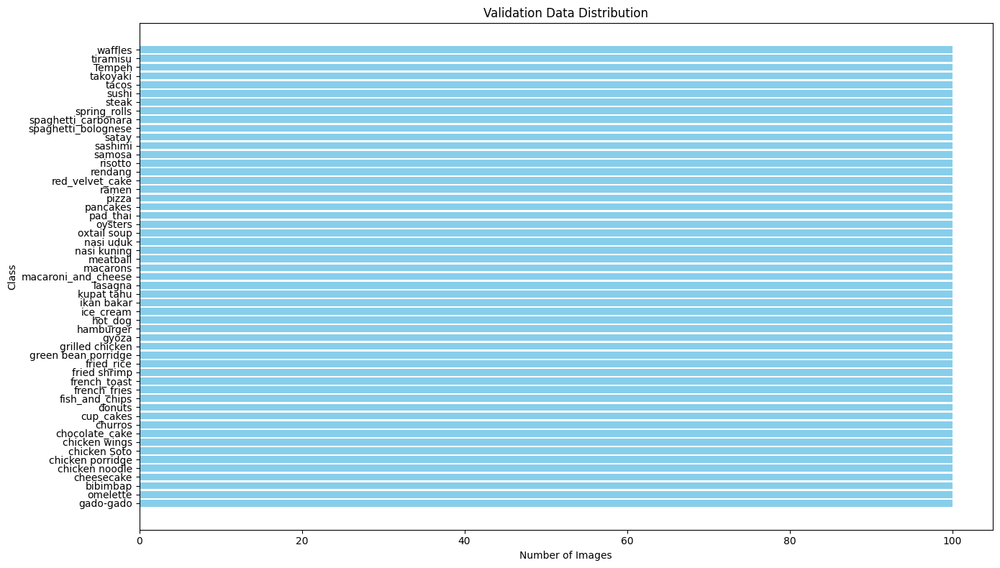

In [ ]:

def count_images_per_class(directory):
    class_counts = {}
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            num_images = len(os.listdir(class_path))
            class_counts[class_name] = num_images
    return class_counts

train_counts = count_images_per_class(train_dir)
validation_counts = count_images_per_class(validation_dir)
test_counts = count_images_per_class(test_dir)


def plot_distribution(counts, title):
    classes = list(counts.keys())
    num_images = list(counts.values())

    plt.figure(figsize=(14, 8))
    plt.barh(classes, num_images, color='skyblue')
    plt.xlabel('Number of Images')
    plt.ylabel('Class')
    plt.title(title)
    plt.tight_layout()
    plt.show()

plot_distribution(train_counts, 'Training Data Distribution')
plot_distribution(validation_counts, 'Validation Data Distribution')


<Figure size 640x480 with 0 Axes>

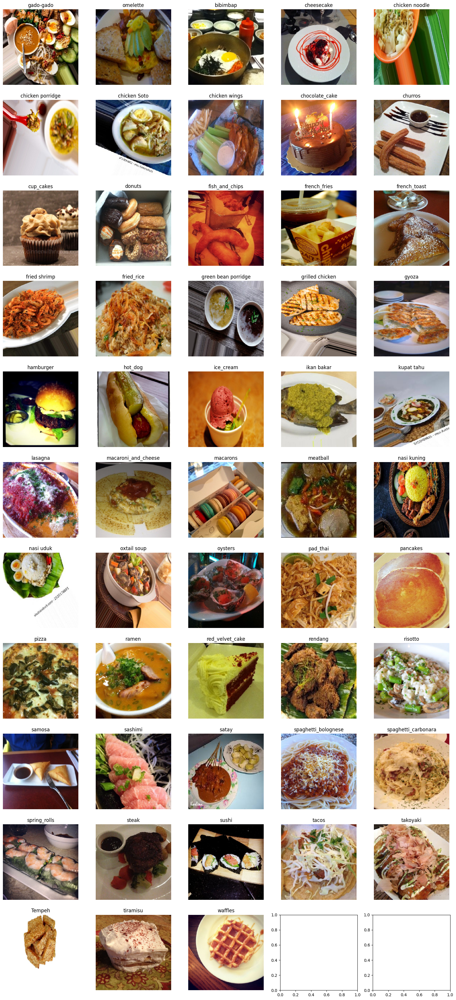

<Figure size 640x480 with 0 Axes>

In [ ]:
import random
nrows=11
ncols=5

BASE_DIR="ML_NutriCheck"
train_dir="ML_NutriCheck/train"
test_dir="ML_NutriCheck/test"
validation_dir="ML_NutriCheck/validation"

fig=plt.gcf()
fig,axes=plt.subplots(nrows,ncols,figsize=(ncols*4, nrows*4))

class_names=os.listdir(train_dir)[:nrows * ncols]

for i, class_name in  enumerate (class_names):
  class_dir=os.path.join(train_dir,class_name)
  image_files=os.listdir(class_dir)
  image_path=os.path.join(class_dir,random.choice(image_files))
  img_to_array=load_img(image_path,target_size=(224,224))
  ax = axes[i // ncols, i % ncols]
  ax.imshow(img_to_array)
  ax.axis('off')
  ax.set_title(class_name)

plt.show()
plt.tight_layout()

# **Data Preparation**

In [6]:
train_dir="ML_NutriCheck/train"
test_dir="ML_NutriCheck/test"
validation_dir="ML_NutriCheck/validation"

def create_data_generators(train_dir,validation_dir):


  train_datagen=ImageDataGenerator(
        rescale=1./255,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
  )
  validation_datagen=ImageDataGenerator(rescale=1.0/255.)

  train_generator=train_datagen.flow_from_directory(
      train_dir,
      target_size=(224,224),
      batch_size=32,
      class_mode='categorical',
      shuffle=True
  )

  validation_generator=validation_datagen.flow_from_directory(
      validation_dir,
      target_size=(224,224),
      batch_size=32,
      class_mode='categorical',
      shuffle=True
  )

  return train_generator,validation_generator

In [7]:
train_generator,validation_generator=create_data_generators(train_dir,validation_dir)

Found 42400 images belonging to 53 classes.
Found 5300 images belonging to 53 classes.


# **Building a model**

In [ ]:
pre_trained_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3),pooling='avg')

for layer in pre_trained_model.layers:
    layer.trainable = False

inputs = pre_trained_model.input
x = tf.keras.layers.Dense(128, activation='relu')(pre_trained_model.output)
x = tf.keras.layers.Dense(128, activation='relu')(x)
outputs = tf.keras.layers.Dense(53, activation='softmax')(x)

model = tf.keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,445,301 (9.33 MB)

 Trainable params: 187,317 (731.71 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

# **Checkpoint Model**

In [ ]:
checkpoint_model = ModelCheckpoint('checkpoint_NutriCheck_MobileNet.keras',
                             monitor="val_accuracy",
                             mode="max",
                             save_best_only=True,
                             verbose=1)

# **Model Compile**

In [ ]:
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

# **Training Model**

In [ ]:
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',
    factor=0.5,
    patience=3,
    verbose=1,
    min_lr=1e-7
)


In [ ]:
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if logs.get('accuracy') >= 0.85 and logs.get('val_accuracy') >= 0.82:
      print(' Accuracy training has been stopped.')
      self.model.stop_training=True

callback=myCallback()

In [ ]:
history= model.fit(
    train_generator,
    epochs=20,
    verbose=1,
    validation_data = validation_generator,
    callbacks = [reduce_lr, checkpoint_model,callback]
)

Epoch 1/20
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - accuracy: 0.5823 - loss: 1.4982

2024-11-24 02:32:24.563126: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1183_0', 344 bytes spill stores, 520 bytes spill loads

2024-11-24 02:32:25.022978: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1183', 16 bytes spill stores, 16 bytes spill loads

2024-11-24 02:32:25.079489: I external/local_xla/xla/stream_executor/cuda/cuda_asm_compiler.cc:397] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_1183', 40 bytes spill stores, 40 bytes spill loads




Epoch 1: val_accuracy improved from -inf to 0.64434, saving model to checkpoint_NutriCheck_MobileNet.keras
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 271s 204ms/step - accuracy: 0.5823 - loss: 1.4982 - val_accuracy: 0.6443 - val_loss: 1.2577 - learning_rate: 1.0000e-04
Epoch 2/20
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step - accuracy: 0.6302 - loss: 1.3182
Epoch 2: val_accuracy improved from 0.64434 to 0.67792, saving model to checkpoint_NutriCheck_MobileNet.keras
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 258s 195ms/step - accuracy: 0.6302 - loss: 1.3182 - val_accuracy: 0.6779 - val_loss: 1.1524 - learning_rate: 1.0000e-04
Epoch 3/20
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step - accuracy: 0.6525 - loss: 1.2261
Epoch 3: val_accuracy improved from 0.67792 to 0.68453, saving model to checkpoint_NutriCheck_MobileNet.keras
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 261s 197ms/step - accuracy: 0.6525 - loss: 1.2261 - val_accuracy: 0.6845 - val_loss: 1.1112 - learning_rate: 1.0000e-04
Epoch 4/20
1325/1325 ━━━━━━━━━━━━━━━━━━

In [ ]:
for layer in pre_trained_model.layers[-20:]:
    layer.trainable = True

model.compile(optimizer=Adam(learning_rate=1e-5), loss='categorical_crossentropy', metrics=['accuracy'])

history= model.fit(
    train_generator,
    epochs=100,
    verbose=1,
    validation_data=validation_generator,
    callbacks=[reduce_lr, checkpoint_model, callback]
)

Epoch 1/100
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step - accuracy: 0.6384 - loss: 1.2780
Epoch 1: val_accuracy did not improve from 0.74358
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 272s 201ms/step - accuracy: 0.6385 - loss: 1.2779 - val_accuracy: 0.7342 - val_loss: 0.9213 - learning_rate: 1.0000e-05
Epoch 2/100
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step - accuracy: 0.7137 - loss: 0.9992
Epoch 2: val_accuracy did not improve from 0.74358
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 267s 201ms/step - accuracy: 0.7137 - loss: 0.9991 - val_accuracy: 0.7432 - val_loss: 0.8938 - learning_rate: 1.0000e-05
Epoch 3/100
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step - accuracy: 0.7411 - loss: 0.9049
Epoch 3: val_accuracy improved from 0.74358 to 0.75434, saving model to checkpoint_NutriCheck_MobileNet.keras
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 270s 204ms/step - accuracy: 0.7411 - loss: 0.9049 - val_accuracy: 0.7543 - val_loss: 0.8610 - learning_rate: 1.0000e-05
Epoch 4/100
1325/1325 ━━━━━━━━━━━━━━━━━━━━ 0s 191ms/step - acc

# **Accuracy Visualization**

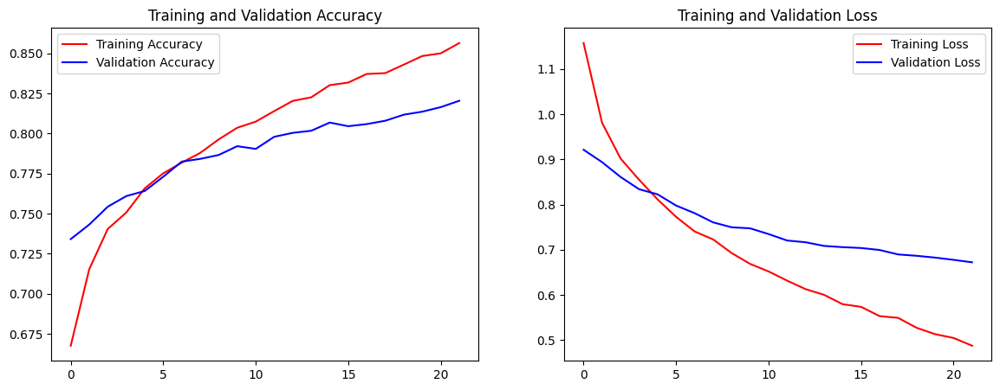

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs, acc, 'r', label='Training Accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, loss, 'r', label='Training Loss')
plt.plot(epochs, val_loss, 'b', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.show()


# Save Model

In [ ]:
model.save("NutriCheck_model.h5")

# **Model Prediction**

Found 5300 images belonging to 53 classes.


/Users/tokyo/anaconda3/envs/tf-m1/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


166/166 ━━━━━━━━━━━━━━━━━━━━ 38s 203ms/step


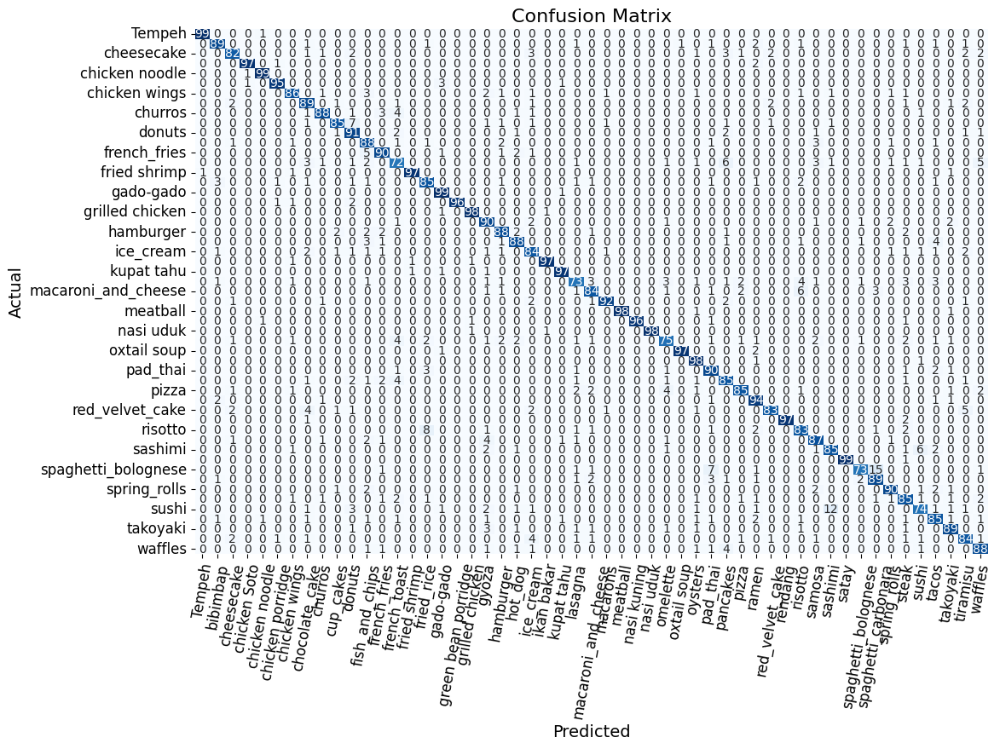

Classification Report:
                     precision    recall  f1-score   support

             Tempeh       0.99      0.99      0.99       100
           bibimbap       0.91      0.89      0.90       100
         cheesecake       0.88      0.82      0.85       100
       chicken Soto       0.98      0.97      0.97       100
     chicken noodle       0.97      0.99      0.98       100
   chicken porridge       0.96      0.95      0.95       100
      chicken wings       0.91      0.86      0.88       100
     chocolate_cake       0.82      0.89      0.86       100
            churros       0.93      0.88      0.90       100
          cup_cakes       0.92      0.85      0.89       100
             donuts       0.81      0.91      0.85       100
     fish_and_chips       0.78      0.88      0.83       100
       french_fries       0.87      0.90      0.89       100
       french_toast       0.77      0.72      0.75       100
       fried shrimp       0.98      0.97      0.97       100


In [7]:
model = load_model("NutriCheck_model.h5")

test_dir = "ML_NutriCheck/test"

test_datagen = ImageDataGenerator(rescale=1.0/255.0)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)

predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

true_classes = test_generator.classes
class_indices = test_generator.class_indices
class_names = list(class_indices.keys())

conf_matrix = confusion_matrix(true_classes, predicted_classes)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=class_names)


cm_df = pd.DataFrame(conf_matrix, index=class_names, columns=class_names)

plt.figure(figsize=(12, 8))
sns.heatmap(cm_df, annot=True, fmt="d", cmap='Blues', cbar=False)
plt.title("Confusion Matrix", fontsize=16)
plt.xticks(rotation=80, fontsize=12)
plt.yticks(fontsize=12)
plt.xlabel('Predicted', fontsize=14)
plt.ylabel('Actual', fontsize=14)
plt.show()

# Print classification report
report = classification_report(true_classes, predicted_classes, target_names=class_names)
print("Classification Report:")
print(report)


In [8]:
loss, accuracy = model.evaluate(test_generator)
print(f"Test Loss: {loss}")
print(f"Test Accuracy: {accuracy}")

166/166 ━━━━━━━━━━━━━━━━━━━━ 42s 235ms/step - accuracy: 0.9070 - loss: 0.3372
Test Loss: 0.38518813252449036
Test Accuracy: 0.8915094137191772


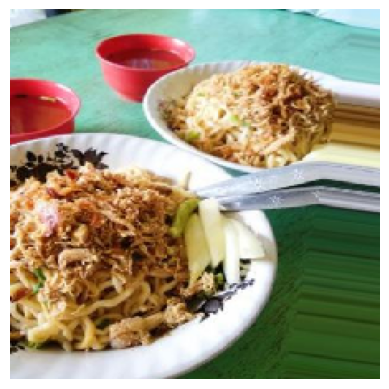

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted Class: chicken noodle


In [ ]:
im = tf.keras.utils.load_img(r"ML_NutriCheck/test/chicken noodle/aug_0_1623.jpeg", target_size=(224, 224))
input_arr = tf.keras.utils.img_to_array(im) / 255.0
input_arr = np.expand_dims(input_arr, axis=0)
images = np.vstack([input_arr])
plt.imshow(im)
plt.axis('off')
plt.show()
predictions = model.predict(images, batch_size=10)
predicted_class = np.argmax(predictions, axis=1)[0]
predicted_class_name = class_names[predicted_class]
print(f"Predicted Class: {predicted_class_name}")



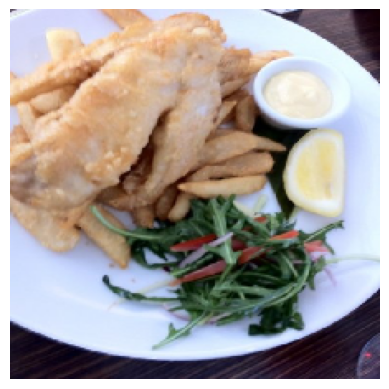

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
Predicted Class: fish_and_chips


In [ ]:
im = tf.keras.utils.load_img(r"ML_NutriCheck/test/fish_and_chips/140212.jpg", target_size=(224, 224))
input_arr = tf.keras.utils.img_to_array(im) / 255.0
input_arr = np.expand_dims(input_arr, axis=0)
images = np.vstack([input_arr])
plt.imshow(im)
plt.axis('off')
plt.show()
predictions = model.predict(images, batch_size=10)
predicted_class = np.argmax(predictions, axis=1)[0]
predicted_class_name = class_names[predicted_class]
print(f"Predicted Class: {predicted_class_name}")



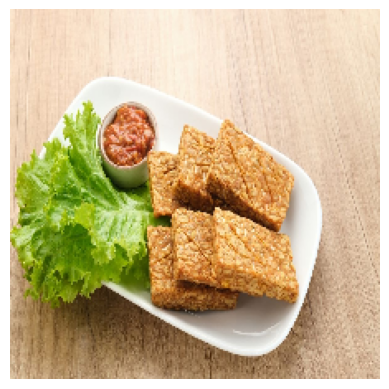

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
Predicted Class: Tempeh


In [ ]:
im = tf.keras.utils.load_img(r"63fede97899d6.jpg", target_size=(224, 224))
input_arr = tf.keras.utils.img_to_array(im) / 255.0
input_arr = np.expand_dims(input_arr, axis=0)
images = np.vstack([input_arr])
plt.imshow(im)
plt.axis('off')
plt.show()
predictions = model.predict(images, batch_size=10)
predicted_class = np.argmax(predictions, axis=1)[0]
predicted_class_name = class_names[predicted_class]
print(f"Predicted Class: {predicted_class_name}")



# Save Label

In [8]:
class_names = validation_generator.class_indices
class_names = {v: k for k, v in class_names.items()}

txt_filename = 'class_labels_NutriCheck.txt'

with open(txt_filename, 'w') as txt_file:
    for index, label in class_names.items():
        txt_file.write(f"{index}\t{label}\n")

print(f"Class labels have been saved to {txt_filename}:")

Class labels have been saved to class_labels_NutriCheck.txt:
